Clustering and anomaly detection in wine Quality 

Name - Ajeesh Garg
course - IMAPP

In [290]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from scipy import stats
# from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score, adjusted_rand_score, accuracy_score
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics.cluster import rand_score

In [291]:
# Loading dataset without columns
white_wine_data = pd.read_csv("D:/Datasets/winequality-white.csv",sep = ';')


# displaying data
white_wine_data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7


In [292]:
# storing the output variable separately
output_data = white_wine_data.iloc[:,-1]


# Loading column names and storing them
col_names = list(white_wine_data.columns)
col_names,label_name=col_names[:-1], col_names[-1]  


# Dropping duplicate data before remocing output label 
white_wine_data.drop_duplicates(inplace=True)    

# Checking new shape to see if we had some duplicates
white_wine_data.shape

(3961, 12)

Hence, we can clearly see we removed lot of duplicates.

In [293]:
# separating out features and labels 
white_wine_data, label_data = white_wine_data.iloc[:,:-1],white_wine_data.iloc[:,-1]
output_label = col_names[-1]


# Giving columns name as column_1, column_2 and so on for an unbiased unsupervised learning
new_col_names = []
for i in range(len(col_names)):
    new_col_names.append("column_"+str(i))

white_wine_data.columns = new_col_names    # Renaming columns

# Displaying first 5 features of data with new column names
white_wine_data.head()

,column_0,column_1,column_2,column_3,column_4,column_5,column_6,column_7,column_8,column_9,column_10
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9
6,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.9949,3.18,0.47,9.6


In [294]:
# displaying the number of instances and their data types explicitly 

# after removing the duplicate data
size = white_wine_data.shape
white_wine_data.info() 

print(f"\nTherefore, data has {size[1]} features and each feature has {size[0]} non-duplicate values/instances.")

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3961 entries, 0 to 4897
Data columns (total 11 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   column_0   3961 non-null   float64
 1   column_1   3961 non-null   float64
 2   column_2   3961 non-null   float64
 3   column_3   3961 non-null   float64
 4   column_4   3961 non-null   float64
 5   column_5   3961 non-null   float64
 6   column_6   3961 non-null   float64
 7   column_7   3961 non-null   float64
 8   column_8   3961 non-null   float64
 9   column_9   3961 non-null   float64
 10  column_10  3961 non-null   float64
dtypes: float64(11)
memory usage: 371.3 KB

Therefore, data has 11 features and each feature has 3961 non-duplicate values/instances.


 Furthermore,
as all variables are floats and Therefore, all features
represent quantitative data.

Basic Statistics of the data

In [295]:
# Describing all central measures of tendancy in one table
white_wine_data.describe()

,column_0,column_1,column_2,column_3,column_4,column_5,column_6,column_7,column_8,column_9,column_10
count,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000
mean,6.839346,0.280538,0.334332,5.914819,0.045905,34.889169,137.193512,0.993790,3.195458,0.490351,10.589358
std,0.866860,0.103437,0.122446,4.861646,0.023103,17.210021,43.129065,0.002905,0.151546,0.113523,1.217076
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000
25%,6.300000,0.210000,0.270000,1.600000,0.035000,23.000000,106.000000,0.991620,3.090000,0.410000,9.500000
50%,6.800000,0.260000,0.320000,4.700000,0.042000,33.000000,133.000000,0.993500,3.180000,0.480000,10.400000
75%,7.300000,0.330000,0.390000,8.900000,0.050000,45.000000,166.000000,0.995710,3.290000,0.550000,11.400000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000


The table above displays central measures of tendancy for all the columns. 
Note - Mode of values are not required as all values are Quantitaive and no categorical data is here.

50% value is median

from here, we can see the difference beteen 75% value and maximum value is far more than the standard deviation values indicating outliers can be present. 

In [296]:
# Dispersion and standard deviation

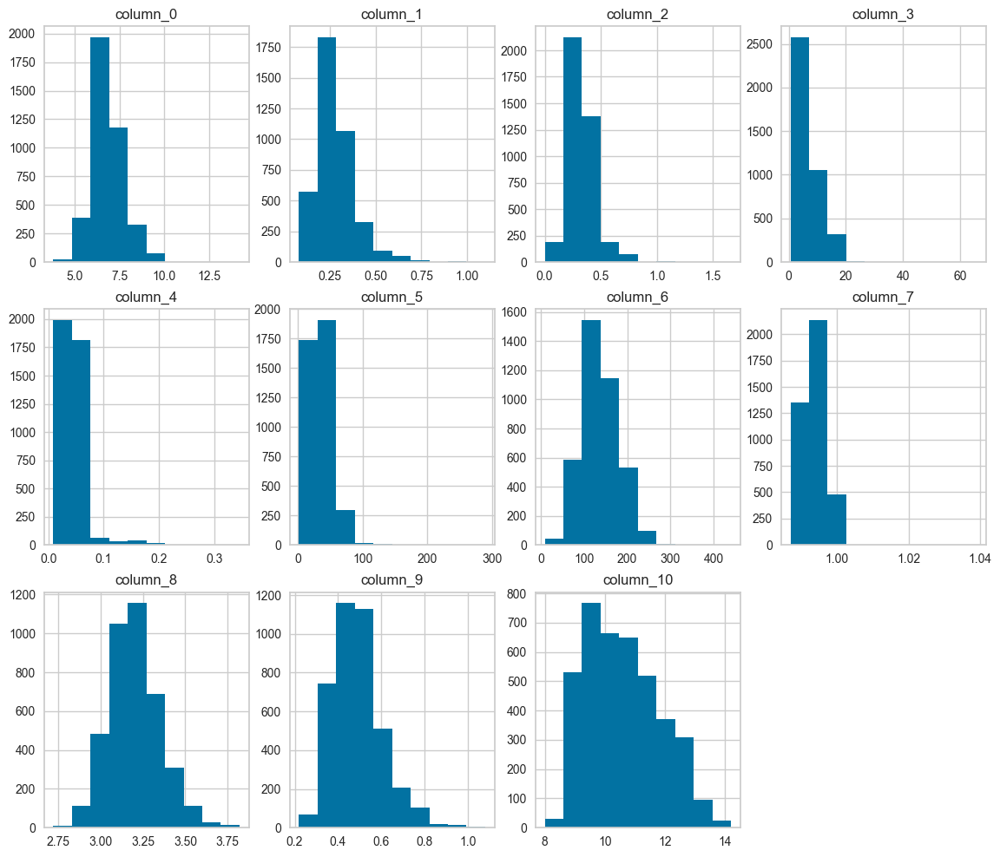

In [297]:
# Visual Univariate statistics

def histogram(data):
    fig = plt.figure(figsize=(14,12))
    for i in range(len(new_col_names)):
        ax = fig.add_subplot(3,4,i+1)
        ax.hist(data.iloc[:,i])    

        # ax.set_xlim(min(data.iloc[:,i]),max(data.iloc[:,i]))
        ax.set_title(new_col_names[i])

    plt.show()

histogram(white_wine_data)

Again the empty looking corners of the graph shows the presence of lot of outliers and they should be determined and fixed before determining the distribution of the data.

Visualising outliers using boxplot


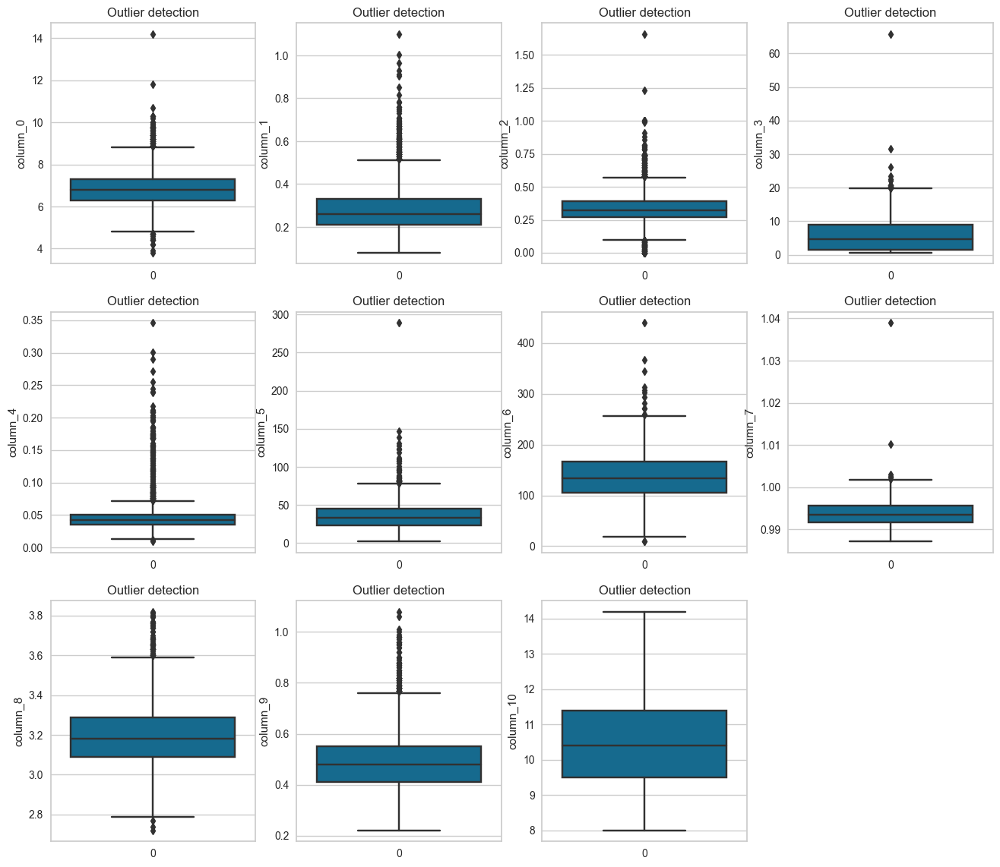

In [298]:
# boxplot plotting function
def plot_boxplot(data, label_name):
    
    fig = plt.figure(figsize=(16, 14))

    for i in range(len(new_col_names)):
        ax = fig.add_subplot(3,4,i+1)
        sns.boxplot(data.iloc[:,i])  
          
        plt.ylabel(new_col_names[i])
        plt.title(label_name)
    plt.show()

# plot Boxplot
plot_boxplot(white_wine_data, "Outlier detection")

Boxplots clearly shows the prensence of lot of outliers and because of their count, they cannot be totally ignored.

In [299]:
# Oulier detection by IQR technique
white_wine_data3 = white_wine_data.copy()

# function to replace outliers with nan
def replace_outliers_iqr(column):
    Q1 = column.quantile(0.25)
    Q3 = column.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    column[(column < lower_bound) | (column > upper_bound)] = np.nan
    return column

# Apply the function to each column in the DataFrame
Cleaned_data1 = white_wine_data3.apply(replace_outliers_iqr, axis=0)


print(Cleaned_data1.isna().sum())

column_0     106
column_1     133
column_2     223
column_3      16
column_4     178
column_5      44
column_6      14
column_7       6
column_8      46
column_9      96
column_10      0
dtype: int64


In [300]:
# filling missing values with their respective medians
white_wine_data2 = white_wine_data.copy()

z_scores=stats.zscore(white_wine_data2)
threshold=3

# setting outlers as Nan
white_wine_data2[(z_scores > threshold) | (z_scores < -threshold)] = np.nan
cleaned_data = white_wine_data2

# Counting outliers
cleaned_data.isna().sum()




column_0     33
column_1     69
column_2     70
column_3      9
column_4     89
column_5     24
column_6     10
column_7      3
column_8     27
column_9     38
column_10     0
dtype: int64

In [301]:
Cleaned_data = Cleaned_data.dropna()
white_wine_data2 = white_wine_data2.fillna(white_wine_data.median())

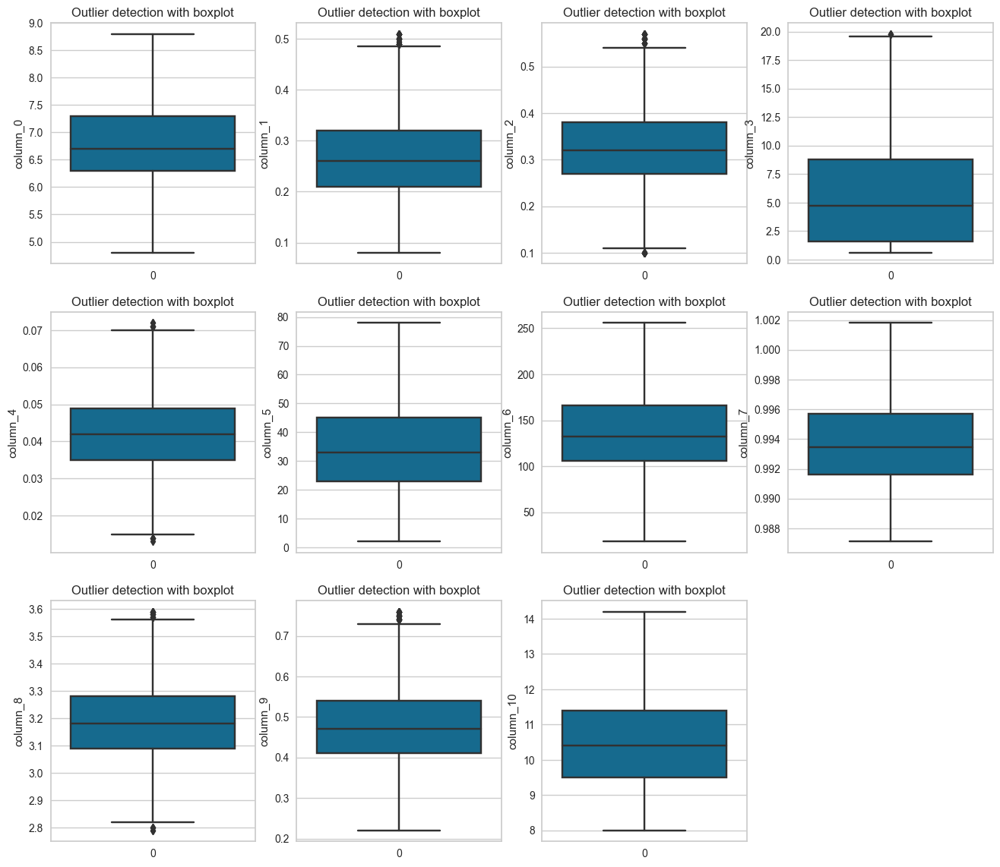

In [302]:
# boxplot plotting function
def plot_boxplot(data, label_name):
    
    fig = plt.figure(figsize=(16, 14))

    for i in range(len(new_col_names)):
        ax = fig.add_subplot(3,4,i+1)
        sns.boxplot(data.iloc[:,i])  
          
        plt.ylabel(new_col_names[i])
        plt.title(label_name)
    plt.show()
    
plot_boxplot(white_wine_data3, "Outlier detection with boxplot")

In [303]:
white_wine_data2.describe()

,column_0,column_1,column_2,column_3,column_4,column_5,column_6,column_7,column_8,column_9,column_10
count,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000
mean,6.818266,0.273084,0.326006,5.861411,0.043044,34.390305,136.722924,0.993771,3.192214,0.486115,10.589358
std,0.813029,0.086997,0.104320,4.699008,0.011914,15.720644,42.070798,0.002798,0.145007,0.105120,1.217076
min,4.400000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.770000,0.220000,8.000000
25%,6.300000,0.210000,0.270000,1.600000,0.035000,23.000000,106.000000,0.991620,3.090000,0.410000,9.500000
50%,6.800000,0.260000,0.320000,4.700000,0.042000,33.000000,133.000000,0.993500,3.180000,0.480000,10.400000
75%,7.300000,0.320000,0.380000,8.800000,0.049000,45.000000,166.000000,0.995700,3.290000,0.550000,11.400000
max,9.400000,0.590000,0.700000,20.400000,0.115000,86.000000,260.000000,1.002410,3.650000,0.830000,14.200000


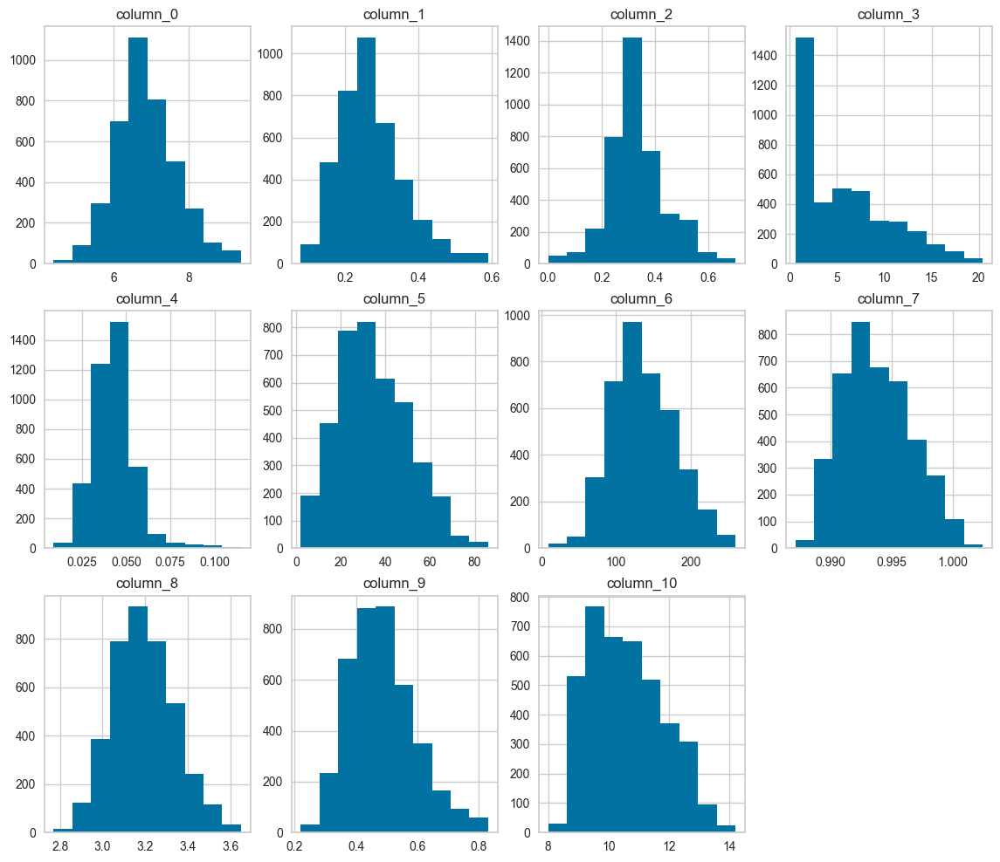

In [304]:
# Histogram after the removal outliers
histogram(white_wine_data2)

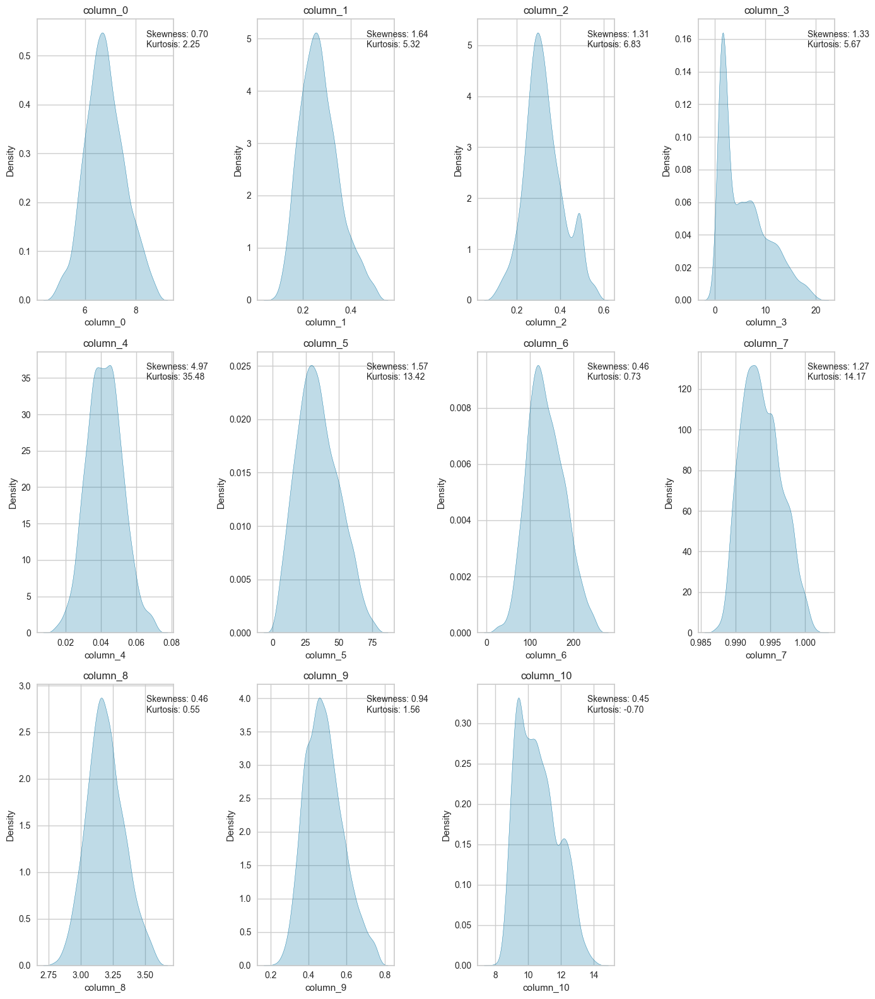

In [305]:
# Kurtosis and skewness of the data wit
skewnesss = stats.skew(white_wine_data)
kurtosis = stats.kurtosis(white_wine_data, fisher=True)


# Visual Univariate statistics
fig = plt.figure(figsize=(14,16))

for i in range(len(new_col_names)):
    ax = fig.add_subplot(3,4,i+1)

    # filling the kde plots with kurtosis and skewness values
    ax.text(0.8, 0.9, f'Skewness: {skewnesss[i]:.2f}\nKurtosis: {kurtosis[i]:.2f}',transform=ax.transAxes, fontsize=10)
    
    
    # stat, pval= stats.shapiro(np.log(white_wine_data3.iloc[:,i]))
    sns.kdeplot(white_wine_data3.iloc[:,i],fill=True)    

    # ax.set_xlim(min(X[:,i]),max(X[:,i]))
    ax.set_title(new_col_names[i])
    # plt.legend()

plt.tight_layout()
plt.show()

Skewness
A left-skewed distribution has a long left tail. Left-skewed distributions are also called negatively-skewed distributions. That’s because there is a long tail in the negative direction on the number line. The mean is also to the left of the peak.

A right-skewed distribution has a long right tail. Right-skewed distributions are also called positive-skew distributions. That’s because there is a long tail in the positive direction on the number line. The mean is also to the right of the peak.

In [306]:

#shapiro wilk test
for i in new_col_names:
    stat, pval = stats.shapiro(white_wine_data[i])
    print(f"for {i}: p={pval} and stat={stat}")
    alpha = 0.05
    if pval > alpha:
        print('  Sample looks Gaussian (fail to reject H0)')
    else:
        print('  Sample does not look Gaussian (reject H0)')
    print("\n")

# the dataset is quite large enough to neglect this test

for column_0: p=3.48268192144598e-26 and stat=0.9741911292076111
  Sample does not look Gaussian (reject H0)


for column_1: p=1.401298464324817e-45 and stat=0.8975299596786499
  Sample does not look Gaussian (reject H0)


for column_2: p=1.554600516321952e-41 and stat=0.9205370545387268
  Sample does not look Gaussian (reject H0)


for column_3: p=0.0 and stat=0.8665334582328796
  Sample does not look Gaussian (reject H0)


for column_4: p=0.0 and stat=0.5778896808624268
  Sample does not look Gaussian (reject H0)


for column_5: p=7.006993986474314e-39 and stat=0.9333932995796204
  Sample does not look Gaussian (reject H0)


for column_6: p=4.162975391744292e-19 and stat=0.986379861831665
  Sample does not look Gaussian (reject H0)


for column_7: p=1.7849167122281956e-35 and stat=0.9473945498466492
  Sample does not look Gaussian (reject H0)


for column_8: p=1.0917049487955442e-17 and stat=0.9881924986839294
  Sample does not look Gaussian (reject H0)


for column_9: p=4.8579655036

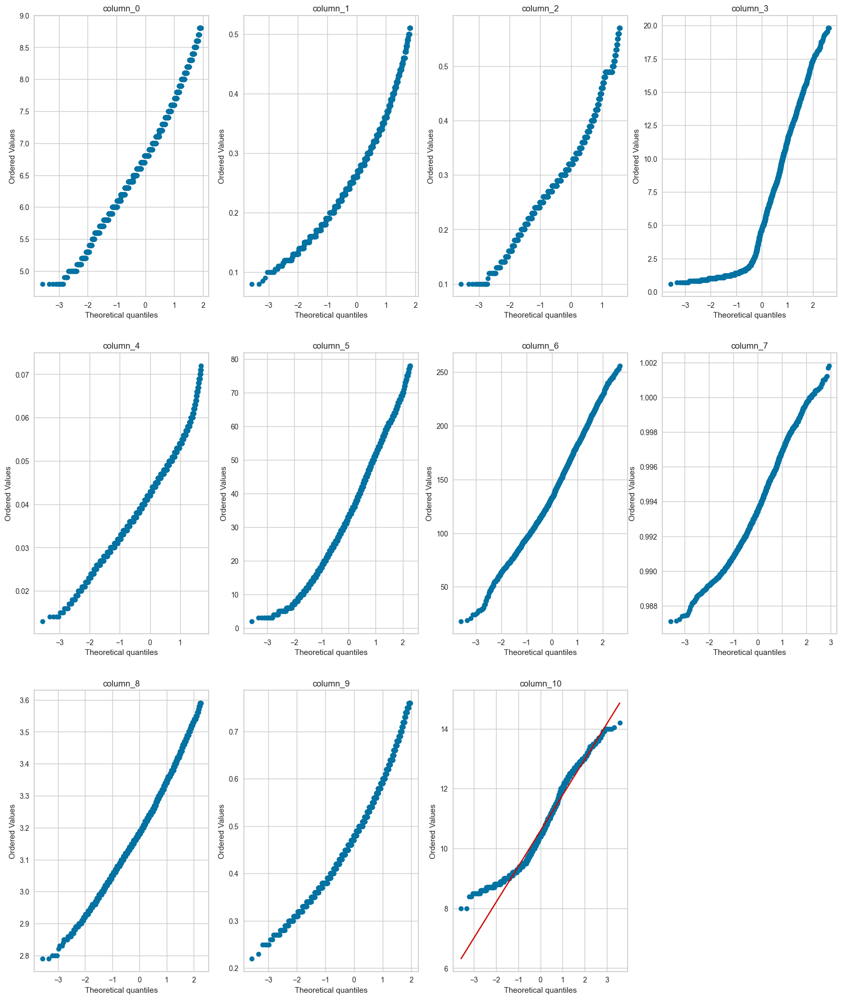

In [307]:
# Visual Univariate statistics
fig = plt.figure(figsize=(20,24))

for i in range(len(new_col_names)):
    ax = fig.add_subplot(3,4,i+1)
    stats.probplot(white_wine_data3.iloc[:,i], dist = 'norm' ,fit="True",plot=plt) 
 

    # ax.set_xlim(min(X[:,i]),max(X[:,i]))
    ax.set_title(new_col_names[i])

plt.show()

In [308]:
# checking null values
null_count = white_wine_data.isnull().sum()
null_count

column_0     0
column_1     0
column_2     0
column_3     0
column_4     0
column_5     0
column_6     0
column_7     0
column_8     0
column_9     0
column_10    0
dtype: int64

hence, no null values.

now before going to multivariate or bivariate analysis, we need to bring the data on a commone scale our data as different features may have very have different scales. To fix this, we analyze the data and this is done by normalisation or standardisation. But in this data, data seems to be already normalised. To show this, i will draw scatter plots showing the data before normalisation.

In [309]:
white_wine_data3.describe()

,column_0,column_1,column_2,column_3,column_4,column_5,column_6,column_7,column_8,column_9,column_10
count,3855.000000,3828.000000,3738.000000,3945.000000,3783.000000,3917.000000,3947.000000,3955.000000,3915.000000,3865.000000,3961.000000
mean,6.786576,0.268673,0.326041,5.838758,0.042069,34.157136,136.734609,0.993765,3.190432,0.481599,10.589358
std,0.760197,0.080683,0.089431,4.669657,0.009970,15.439774,41.956553,0.002791,0.142740,0.099514,1.217076
min,4.800000,0.080000,0.100000,0.600000,0.013000,2.000000,18.000000,0.987110,2.790000,0.220000,8.000000
25%,6.300000,0.210000,0.270000,1.600000,0.035000,23.000000,106.000000,0.991605,3.090000,0.410000,9.500000
50%,6.700000,0.260000,0.320000,4.700000,0.042000,33.000000,132.000000,0.993480,3.180000,0.470000,10.400000
75%,7.300000,0.320000,0.380000,8.800000,0.049000,45.000000,166.000000,0.995700,3.280000,0.540000,11.400000
max,8.800000,0.510000,0.570000,19.800000,0.072000,78.000000,256.000000,1.001820,3.590000,0.760000,14.200000


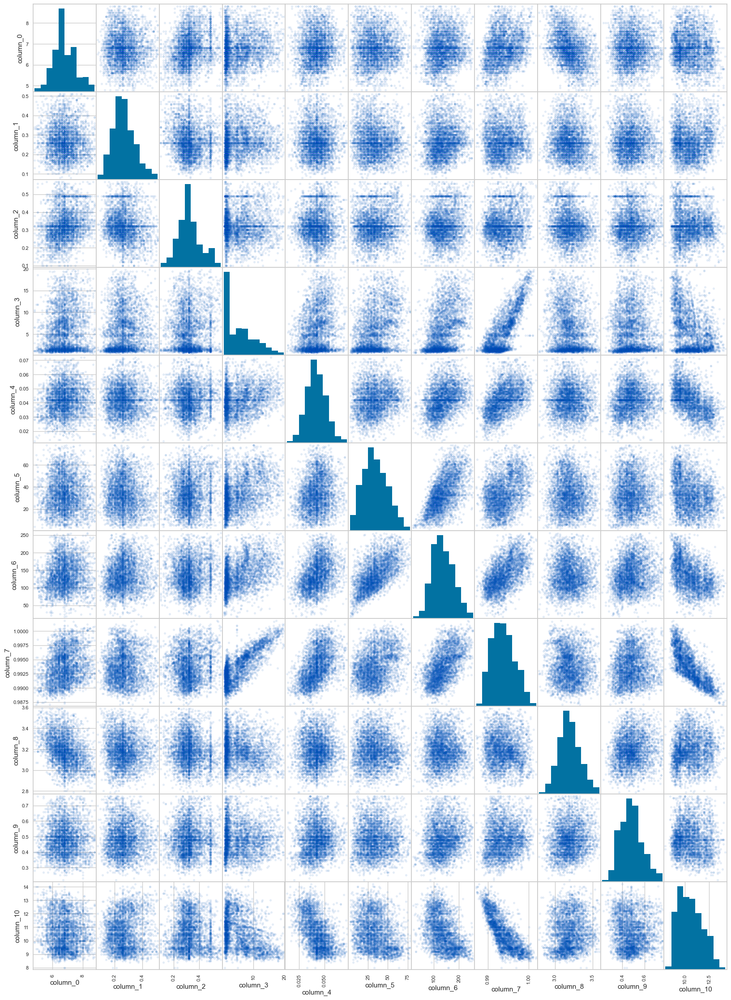

In [310]:
# Without any normalisation, we are still being able to visualise the relationships between vaiables quite nicely
# I have tried to clean data here and this is making my realtionships look fuzzy
p=pd.plotting.scatter_matrix(Cleaned_data,figsize=(20,28),marker="o", s=10, edgecolors='blue', alpha=0.1)

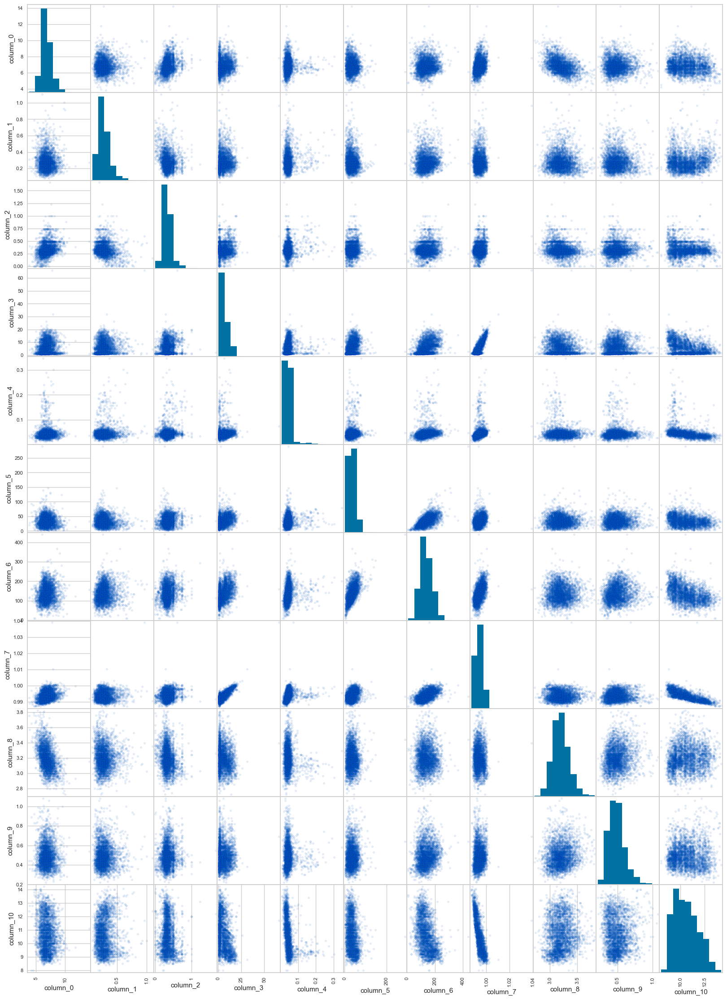

In [311]:
# Without any normalisation, we are still being able to visualise the relationships between vaiables quite nicely
p=pd.plotting.scatter_matrix(data_with_outliers,figsize=(20,28),marker="o", s=10, edgecolors='blue', alpha=0.1)

The plot analyzes the relationships between different features.
Some columns does appear to exhibit linear relationships with other columns while column especially seem to be independent of all the other fea

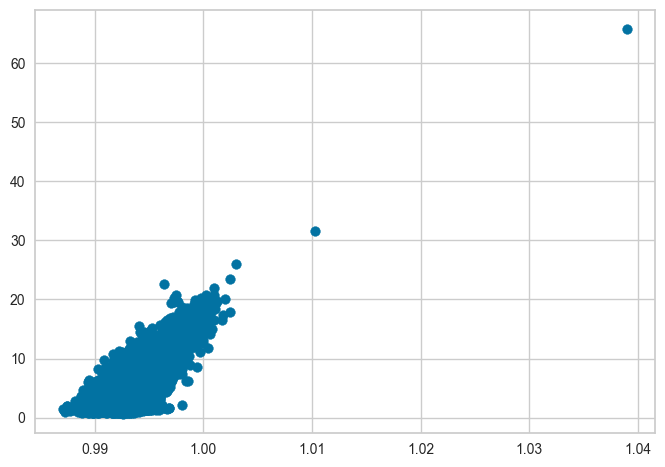

In [312]:
plt.scatter(white_wine_data["column_7"], white_wine_data["column_3"])

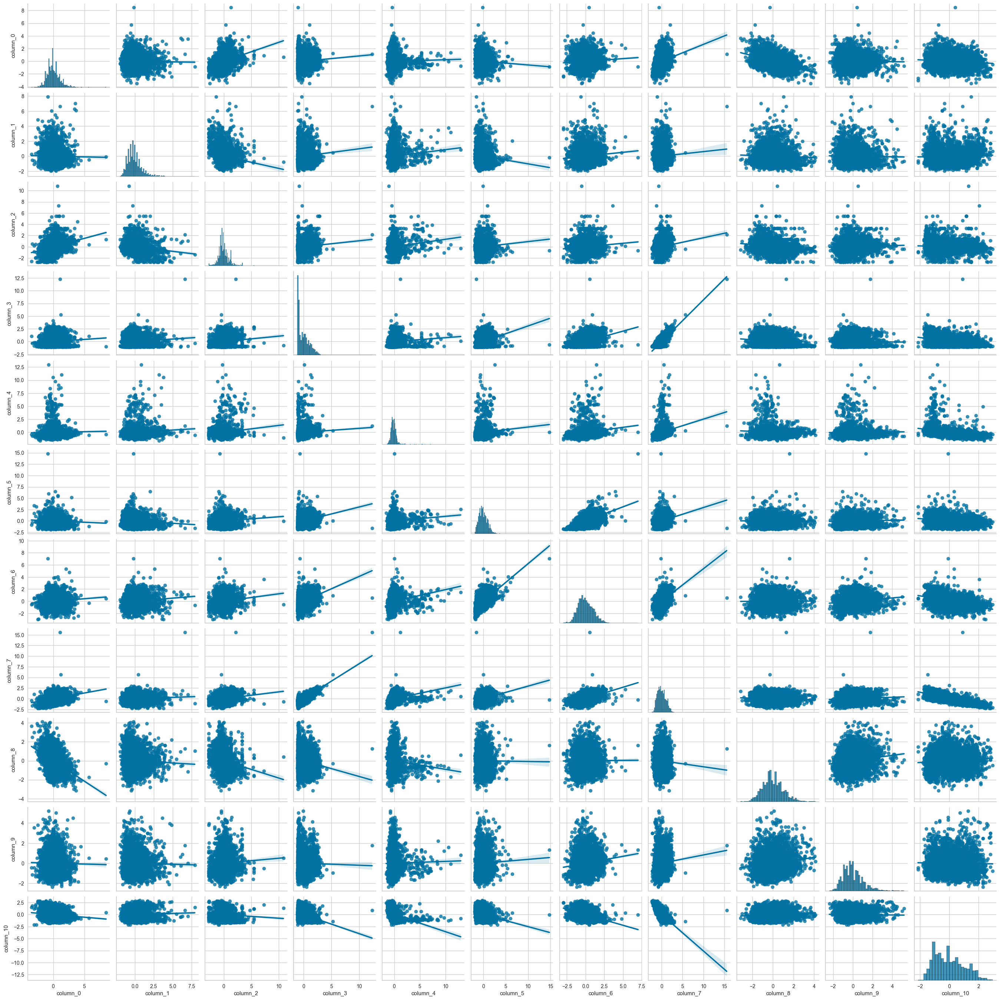

In [313]:
sns.pairplot(standardised_data, kind="reg")

Anomilies can be seen clearly in our data in the plot

<Axes: >

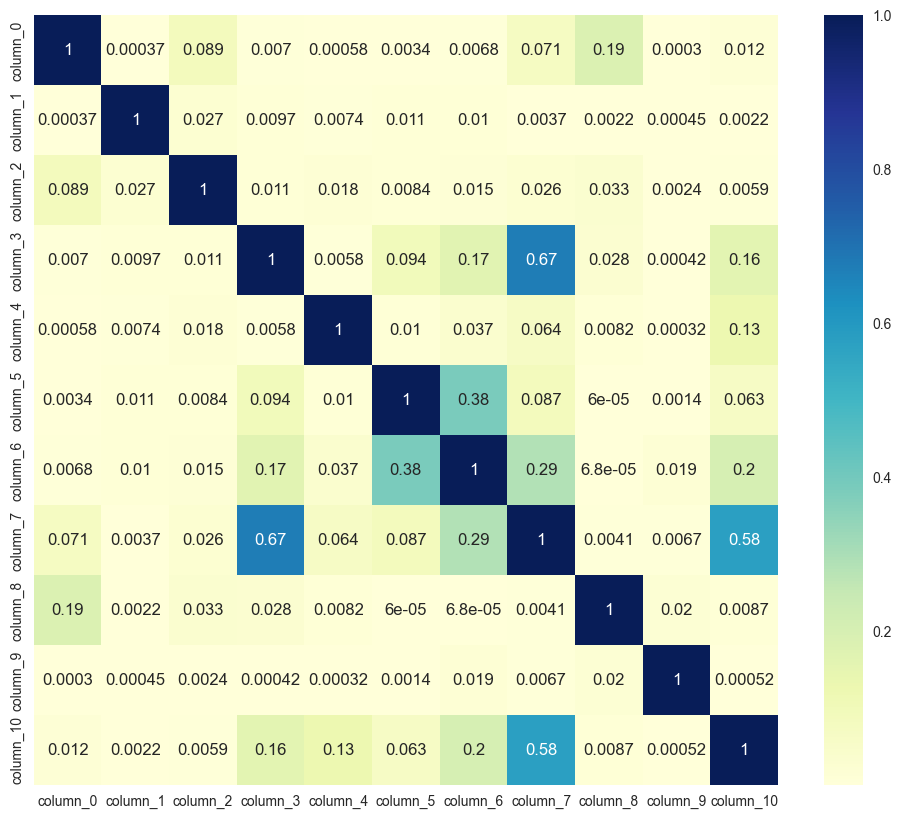

In [314]:
plt.figure(figsize=(12,10))
sns.heatmap((data_with_outliers.corr("pearson"))**2, annot=True,cmap="YlGnBu")

PCA

Chosen Number of Components: 2
Explained Variance Ratio: 0.9902
Chosen Number of Components: 3
Explained Variance Ratio: 0.9991


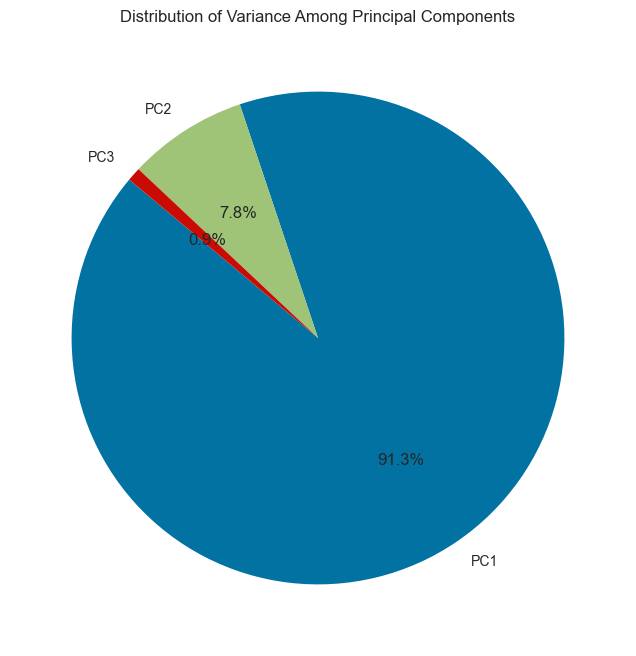

In [315]:
white_wine_data_copy = white_wine_data.copy()
# plotting a pie chart showing how much varience, 
# each principal component of data brings in 
for x in range(2, 4):
    optimal_n_components = x
    # Apply PCA with the optimal number of components
    pca = PCA(n_components=optimal_n_components)
    X_pca = pca.fit_transform(white_wine_data_copy)
    
    # Display the results
    print(f"Chosen Number of Components: {optimal_n_components}")
    print(f"Explained Variance Ratio: {pca.explained_variance_ratio_.cumsum()[-1]:.4f}")

explained_variance = pca.explained_variance_ratio_

# Pie chart showing variance for every feature
plt.figure(figsize=(8, 8))
plt.pie(explained_variance, labels=[f'PC{i+1}' for i in range(len(explained_variance))], autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Variance Among Principal Components')
plt.show()

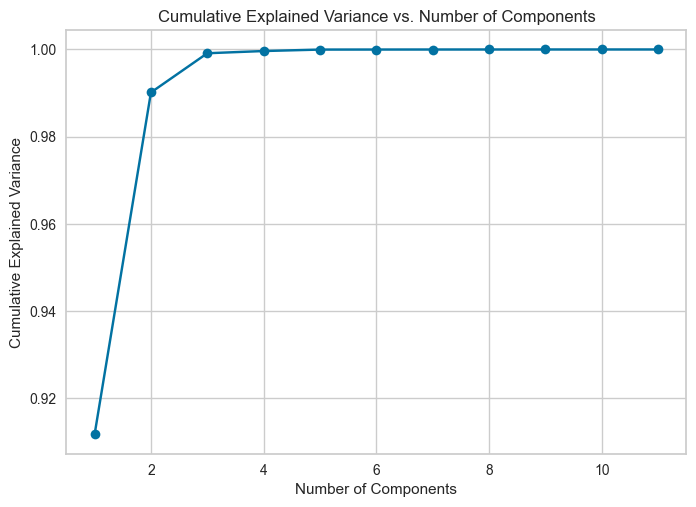

In [316]:
# Calculating the explained variance for different number of components
pca = PCA()
pca.fit(white_wine_data_copy)

# Ploting the explained variance vs number of components ratio
cumulative_variance = pca.explained_variance_ratio_.cumsum()
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance vs. Number of Components')
plt.show()

PCA for 2D

In [317]:
# Data which will get reduced
data_to_reduce1 = white_wine_data.copy()


pca = PCA(n_components=2)
pca = pca.fit(data_to_reduce1)
reduced_features = pca.transform(data_to_reduce1)

# principle components developed by PCA for 2D
reduced_features_2D= pd.DataFrame(reduced_features, columns=["PC1","PC2"])
reduced_features_2D

,PC1,PC2
0,34.967444,1.319910
1,-10.670951,-18.846185
2,-39.969123,5.862194
3,50.344438,-1.134383
4,-2.372779,-4.386033
...,...,...
3956,-46.619938,1.339142
3957,35.600032,13.245362
3958,-26.729252,2.105841
3959,-30.364187,-7.247383


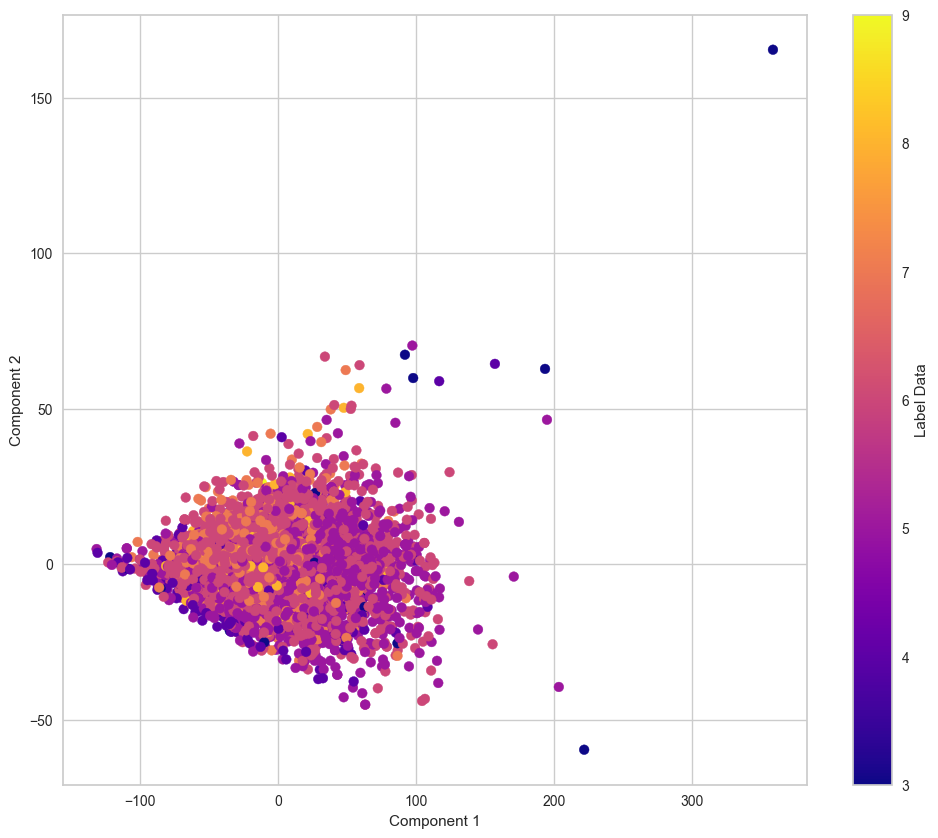

In [318]:
plt.figure(figsize=(12,10))

# Scatter plot
scatter = plt.scatter(reduced_features_2D["PC1"], reduced_features_2D["PC2"], c=label_data, cmap='plasma')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
cbar = plt.colorbar(scatter)         # colorbar
cbar.set_label('Label Data')

plt.show()

Visualisation in 3D using PCA

In [320]:
# Data which will get reduced
data_to_reduce = white_wine_data.copy()

# reducing to 3D 
pca = PCA(n_components=3)
pca = pca.fit(data_to_reduce)
reduced_features_3D = pca.transform(data_to_reduce)

# principle components developed by PCA stored inside this new variable reduced features
reduced_features_3D = pd.DataFrame(reduced_features_3D, columns=["PC1","PC2","PC3"])
reduced_features_3D  #principal components of PCA in 3D

,PC1,PC2,PC3
0,34.967444,1.319910,13.254125
1,-10.670951,-18.846185,-3.483843
2,-39.969123,5.862194,2.805236
3,50.344438,-1.134383,0.317310
4,-2.372779,-4.386033,1.314920
...,...,...,...
3956,-46.619938,1.339142,-2.218910
3957,35.600032,13.245362,0.314013
3958,-26.729252,2.105841,-3.419788
3959,-30.364187,-7.247383,-3.472688


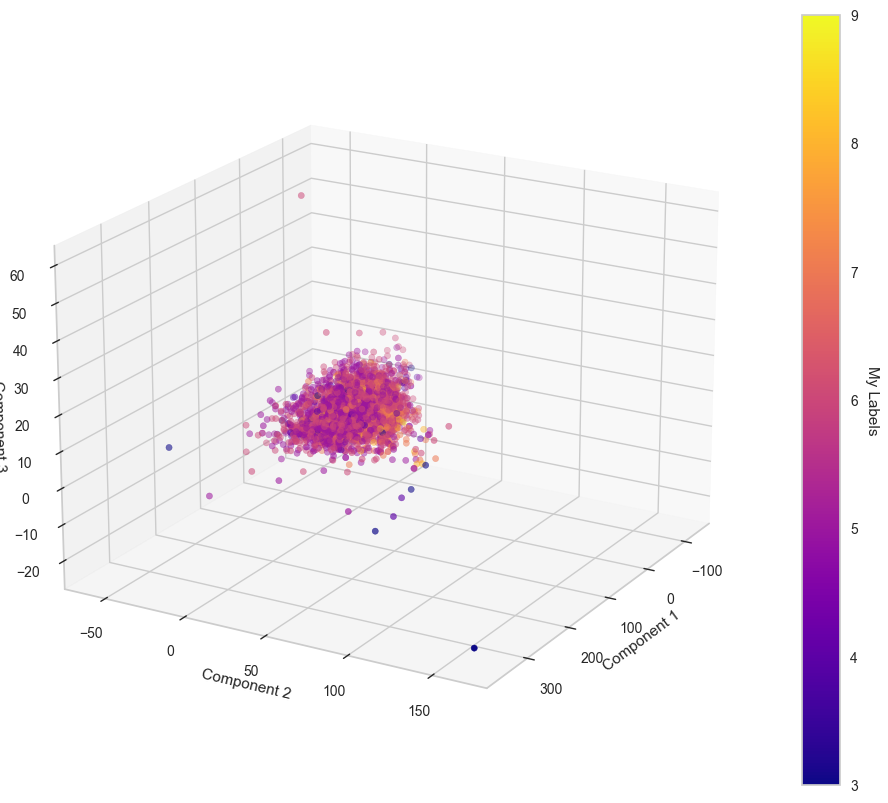

In [321]:
plt.figure(figsize=(12,10))
ax = plt.axes(projection='3d')
my_plot = ax.scatter3D(reduced_features_3D["PC1"],reduced_features_3D["PC2"],reduced_features_3D["PC3"], c=label_data, cmap='plasma')
ax.set_xlabel('Component 1')
ax.set_ylabel('Component 2')
ax.set_zlabel('Component 3')
ax.view_init(elev=20, azim=30)  # Adjust the orientation to get the best view

# Add color bar
cbar = plt.colorbar(my_plot)
cbar.set_label('My Labels', rotation=270, labelpad=15)
plt.show()

# ax.legend(frameon=False, fontsize=18)

In [ ]:
print(f"As there are 6 different {label_data.unique()}. we decided to make 6 clusters.")

Clustering

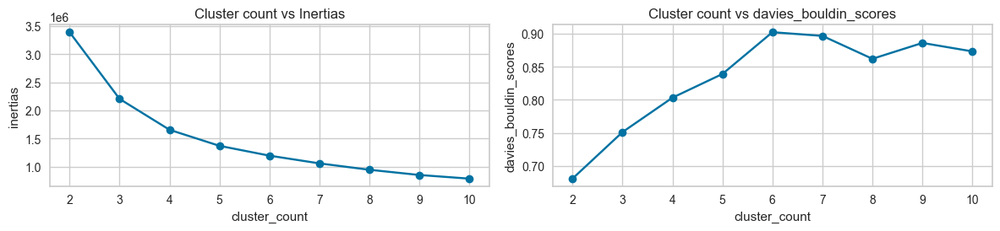

In [ ]:
# selecting cluter count for elbow curve and various indexes
cluster_count = range(2 ,11)             

reduced_features2 = reduced_features.copy()
# empty lists creation to store the score results in them
inertias = []
silhouette_scores = []             
davies_bouldin_scores = []
calinski_harabasz_scores = []


# Applying kmeans
for n in cluster_count:
    kmeans = KMeans(n_clusters=n,n_init="auto",random_state=42)
    labels = kmeans.fit_predict(reduced_features_2D)


    cal_silhouette_score= silhouette_score(reduced_features_2D, labels)
    davies_bouldin_scor = davies_bouldin_score(reduced_features_2D,labels)
    calinski_harabasz_scor = calinski_harabasz_score(reduced_features_2D, labels)

    cal_inertia = kmeans.inertia_

    # putting in the calculed scores into out lists
    inertias.append(cal_inertia), silhouette_scores.append(cal_silhouette_score)
    davies_bouldin_scores.append(davies_bouldin_scor), calinski_harabasz_scores.append(calinski_harabasz_scor)



# Plotting function
fig = plt.figure(figsize=(12,5))
ax1 = fig.add_subplot(221)
ax1.plot(cluster_count, inertias, marker="o")
plt.xlabel("cluster_count")
plt.ylabel("inertias")
plt.title(f"Cluster count vs Inertias")



ax2 = fig.add_subplot(222)
ax2.plot(cluster_count, davies_bouldin_scores, marker="o")
plt.xlabel("cluster_count")
plt.ylabel("davies_bouldin_scores")
plt.title(f"Cluster count vs davies_bouldin_scores")

# ax3 = fig.add_subplot(223)
# ax3.plot(cluster_count, calinski_harabasz_scores, marker="o")
# plt.xlabel("cluster_count")
# plt.ylabel("calinski_harabasz_scores")
# plt.title(f"Cluster count vs calinski_harabasz_scores")



# ax4 = fig.add_subplot(224)
# ax4.plot(cluster_count, silhouette_scores, marker="o")
# plt.xlabel("cluster_count")
# plt.ylabel("silhouette_scores")
# plt.title(f"Cluster count vs silhouette_scores")
plt.tight_layout()
plt.show()

#### they are commented as those indexes are giving opposite reulst but they are not that good for k means so they are commented.

clustering for 6 clusters as there are 6 unique values of label in 2D

In [ ]:
# Assuming labels_data contains your true labels
true_labels = label_data

# Applying pca to reduce data to 3D based on curves above
# pca = PCA(n_components=3)
# reduced_white_wine = pca.fit_transform(reduced_features)

kmeans = KMeans(n_clusters=6,init="k-means++",n_init="auto")
predicted_labels = kmeans.fit_predict(reduced_features_2D)

# Calculate metrics
ari = adjusted_rand_score(true_labels, predicted_labels)
ri = rand_score(true_labels, predicted_labels)
accuracy = accuracy_score(true_labels, predicted_labels)

print(f"Rand Index (RI): {ri}")
print(f"Accuracy: {accuracy}")

Rand Index (RI): 0.6126999609832228
Accuracy: 0.049987376925018936


In [ ]:
# printing predicted labels and the true labels
print(f"True labels are {true_labels.unique()}")
print(f"Predicted labels are {np.unique(predicted_labels)}")

True labels are [6 5 7 8 4 3 9]
Predicted labels are [0 1 2 3 4 5]


In [ ]:
print(f"clsuter centers viewed: {kmeans.cluster_centers_}")

clsuter centers viewed: [[ 22.50478371   1.92436085]
 [-35.1129454    0.60110091]
 [ -7.73321873  -0.62326901]
 [100.36460309  -0.69760582]
 [-69.57083235  -0.5822781 ]
 [ 55.46182903  -2.03248632]]


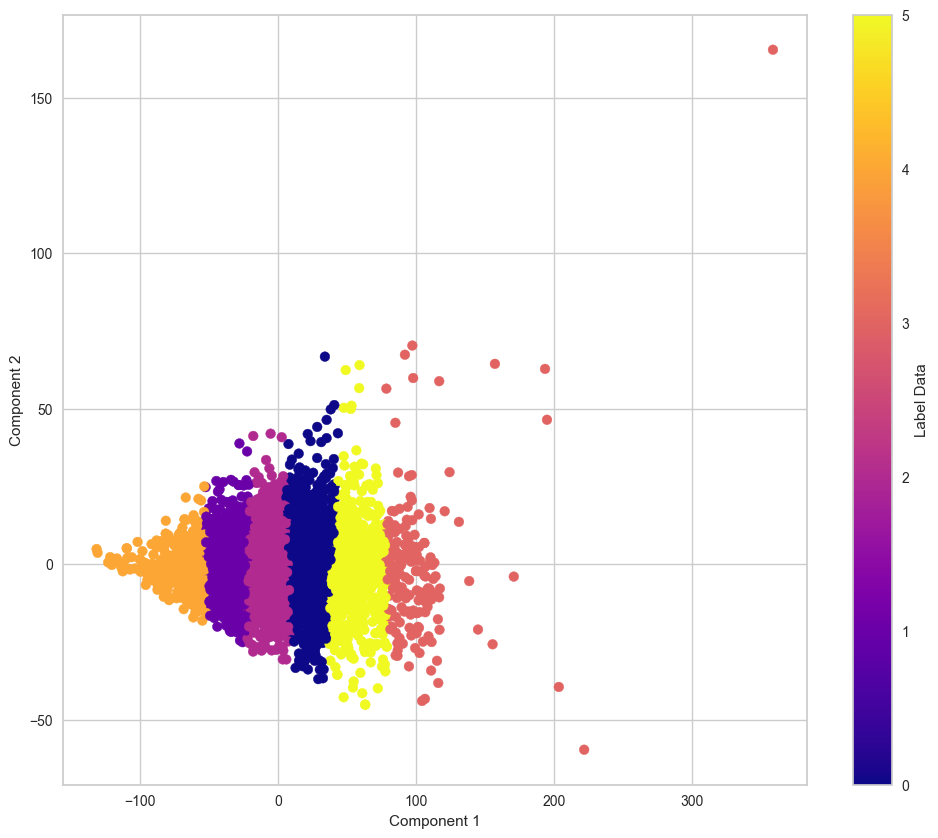

In [ ]:
plt.figure(figsize=(12,10))

# Scatter plot
ax = plt.scatter(reduced_features_2D["PC1"], reduced_features_2D["PC2"], c=predicted_labels, cmap='plasma')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
cbar = plt.colorbar(ax)         # colorbar
cbar.set_label('Label Data')

plt.show()

clustering for 3 clusters as there are 6 unique values of label in 3D

In [ ]:
# Assuming labels_data contains your true labels
true_labels = label_data

# Applying pca to reduce data to 3D based on curves above
# pca = PCA(n_components=3)
# reduced_white_wine = pca.fit_transform(reduced_features)

kmeans = KMeans(n_clusters=3,init="k-means++",n_init="auto")
predicted_labels = kmeans.fit_predict(reduced_features_2D)

# Calculate metrics
ri = rand_score(true_labels, predicted_labels)
accuracy = accuracy_score(true_labels, predicted_labels)

print(f"Rand Index (RI): {ri}")
print(f"Accuracy: {accuracy}")

Adjusted Rand Index (ARI): 0.014081111569581682
Rand Index (RI): 0.559226065247272
Accuracy: 0.0


In [ ]:
print(f"clsuter centers viewed: {kmeans.cluster_centers_}")

clsuter centers viewed: [[ 61.13559957  -0.74534816]
 [  4.02102597   0.31839966]
 [-44.88269087   0.12672816]]


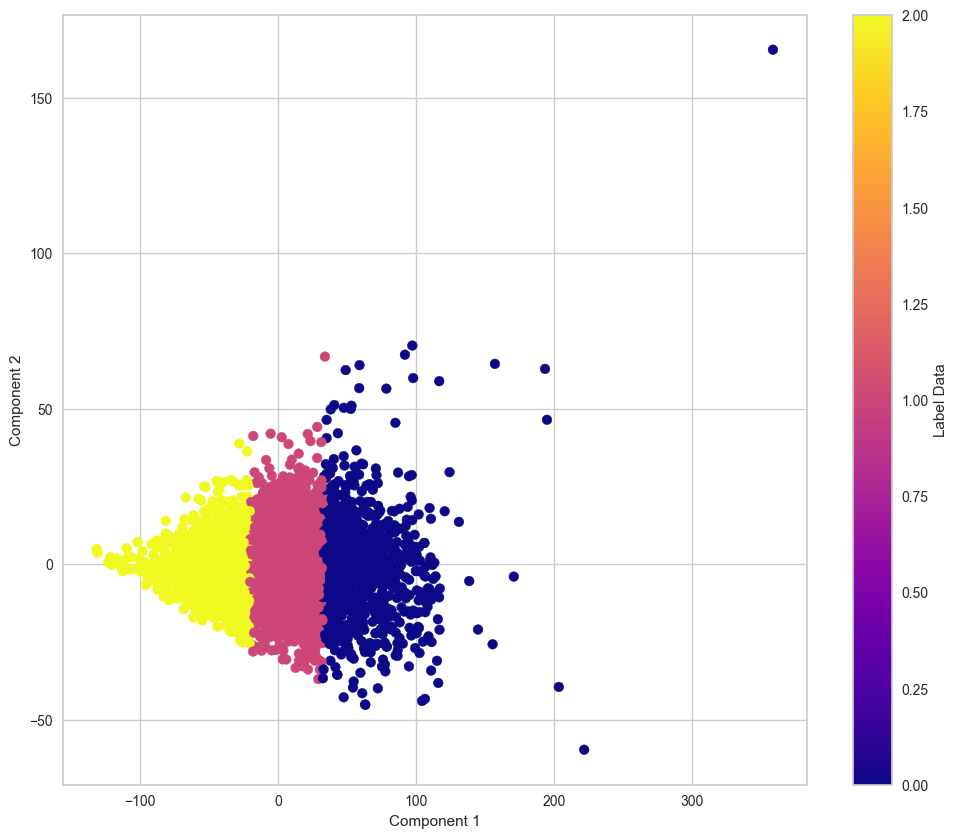

In [ ]:
plt.figure(figsize=(12,10))

# Scatter plot
ax = plt.scatter(reduced_features_2D["PC1"], reduced_features_2D["PC2"], c=predicted_labels, cmap='plasma')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
cbar = plt.colorbar(ax)         # colorbar
cbar.set_label('Label Data')

plt.show()

Finding the actual optimal number for the cluster

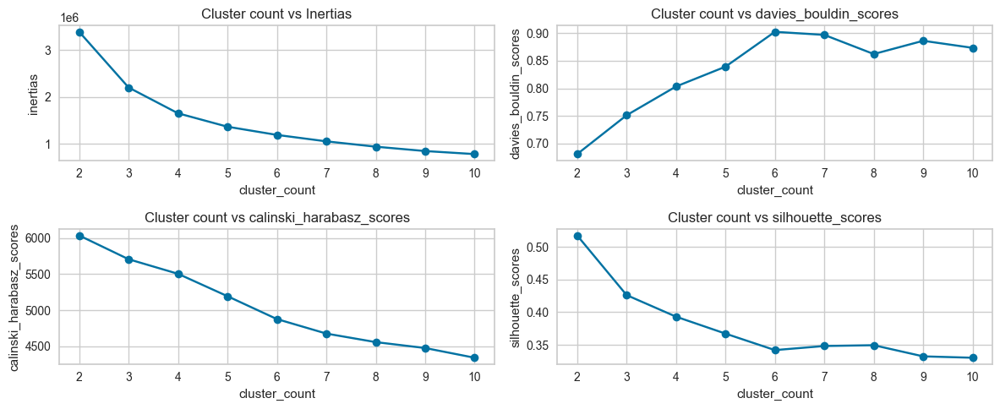

In [ ]:
# selecting cluter count for elbow curve and various indexes
cluster_count = range(2 ,11)             

reduced_features2 = reduced_features.copy()
# empty lists creation to store the score results in them
inertias = []
silhouette_scores = []             
davies_bouldin_scores = []
calinski_harabasz_scores = []


# Applying kmeans
for n in cluster_count:
    kmeans = KMeans(n_clusters=n,n_init="auto",random_state=42)
    labels = kmeans.fit_predict(reduced_features_2D)


    cal_silhouette_score= silhouette_score(reduced_features_2D, labels)
    davies_bouldin_scor = davies_bouldin_score(reduced_features_2D,labels)
    calinski_harabasz_scor = calinski_harabasz_score(reduced_features_2D, labels)

    cal_inertia = kmeans.inertia_

    # putting in the calculed scores into out lists
    inertias.append(cal_inertia), silhouette_scores.append(cal_silhouette_score)
    davies_bouldin_scores.append(davies_bouldin_scor), calinski_harabasz_scores.append(calinski_harabasz_scor)



# Plotting function
fig = plt.figure(figsize=(12,5))
ax1 = fig.add_subplot(221)
ax1.plot(cluster_count, inertias, marker="o")
plt.xlabel("cluster_count")
plt.ylabel("inertias")
plt.title(f"Cluster count vs Inertias")



ax2 = fig.add_subplot(222)
ax2.plot(cluster_count, davies_bouldin_scores, marker="o")
plt.xlabel("cluster_count")
plt.ylabel("davies_bouldin_scores")
plt.title(f"Cluster count vs davies_bouldin_scores")

# ax3 = fig.add_subplot(223)
# ax3.plot(cluster_count, calinski_harabasz_scores, marker="o")
# plt.xlabel("cluster_count")
# plt.ylabel("calinski_harabasz_scores")
# plt.title(f"Cluster count vs calinski_harabasz_scores")



# ax4 = fig.add_subplot(224)
# ax4.plot(cluster_count, silhouette_scores, marker="o")
# plt.xlabel("cluster_count")
# plt.ylabel("silhouette_scores")
# plt.title(f"Cluster count vs silhouette_scores")
plt.tight_layout()
plt.show()



6 Clusters in 3D

In [ ]:
# Assuming labels_data contains your true labels
true_labels = label_data


kmeans = KMeans(n_clusters=6,init="k-means++",n_init="auto")
predicted_labels = kmeans.fit_predict(reduced_features_2D)

# Calculate metrics
ari = adjusted_rand_score(true_labels, predicted_labels)
ri = rand_score(true_labels, predicted_labels)
accuracy = accuracy_score(true_labels, predicted_labels)

print(f"Adjusted Rand Index (ARI): {ari}")
print(f"Rand Index (RI): {ri}")
print(f"Accuracy: {accuracy}")

Adjusted Rand Index (ARI): 0.011721772917971794
Rand Index (RI): 0.6125214528521774
Accuracy: 0.039636455440545316


In [ ]:
# Assuming labels_data contains your true labels
true_labels = label_data

# Applying pca to reduce data to 3D based on curves above
# pca = PCA(n_components=3)
# reduced_white_wine = pca.fit_transform(reduced_features)

kmeans = KMeans(n_clusters=6,init="k-means++",n_init="auto")
predicted_labels = kmeans.fit_predict(reduced_features_3D)

# Calculate metrics
ari = adjusted_rand_score(true_labels, predicted_labels)
ri = rand_score(true_labels, predicted_labels)
accuracy = accuracy_score(true_labels, predicted_labels)

print(f"Adjusted Rand Index (ARI): {ari}")
print(f"Rand Index (RI): {ri}")
print(f"Accuracy: {accuracy}")

Adjusted Rand Index (ARI): 0.012984098466778546
Rand Index (RI): 0.6128167563032496
Accuracy: 0.06765968189851047


In [ ]:
np.shape(kmeans.cluster_centers_)
kmeans.cluster_centers_

array([[ 1.76857237e+01,  2.36500100e+00,  1.54774243e-01],
       [ 9.20543933e+01, -2.43516920e+00,  8.85798931e-02],
       [-7.15804624e+01, -8.46666663e-01,  4.25000555e-01],
       [-3.82142421e+01,  1.14648587e+00, -3.00656072e-01],
       [ 4.90955236e+01, -9.67566392e-01,  3.41183554e-01],
       [-1.18376861e+01, -1.37112407e+00, -2.70300121e-01]])

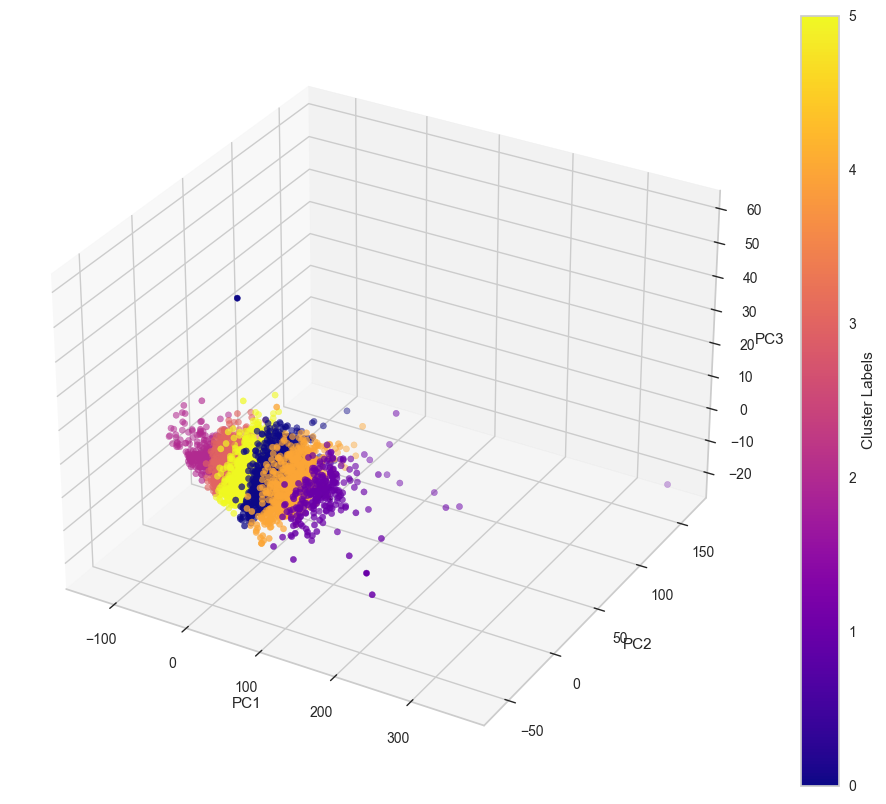

In [ ]:

xi, yi, zi = reduced_features_3D.iloc[:,0], reduced_features_3D.iloc[:,1], reduced_features_3D.iloc[:,2]

from mpl_toolkits import mplot3d
plt.figure(figsize=(12,10))
ax = plt.axes(projection='3d')
scatter = ax.scatter3D(xi, yi, zi,c=predicted_labels, cmap="plasma")
ax.scatter3D(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1],kmeans.cluster_centers_[:,2], s=100 ,marker='x', color='black', label='Centroids')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

cbar = plt.colorbar(scatter, ax=ax) # adds a colorbar
cbar.set_label('Cluster Labels')
# ax.legend(frameon=False, fontsize=18)
plt.show()


DBSCAN

For each instance, the algorithm counts how many instances are located
within a small distance ε (epsilon) from it. This region is called
the instance’s ε-neighborhood.
min samples def fro official documents (to be set to number of features)

In [ ]:
# for n in cluster_cou
dbscan = DBSCAN(eps=2.5, min_samples=11)
cal_labels = dbscan.fit_predict(reduced_features_3D)

new_data = pd.DataFrame(reduced_features_3D.copy())
new_data["cal_labels"] = cal_labels

print(cal_labels)

[-1 -1 -1 ...  0  0  0]


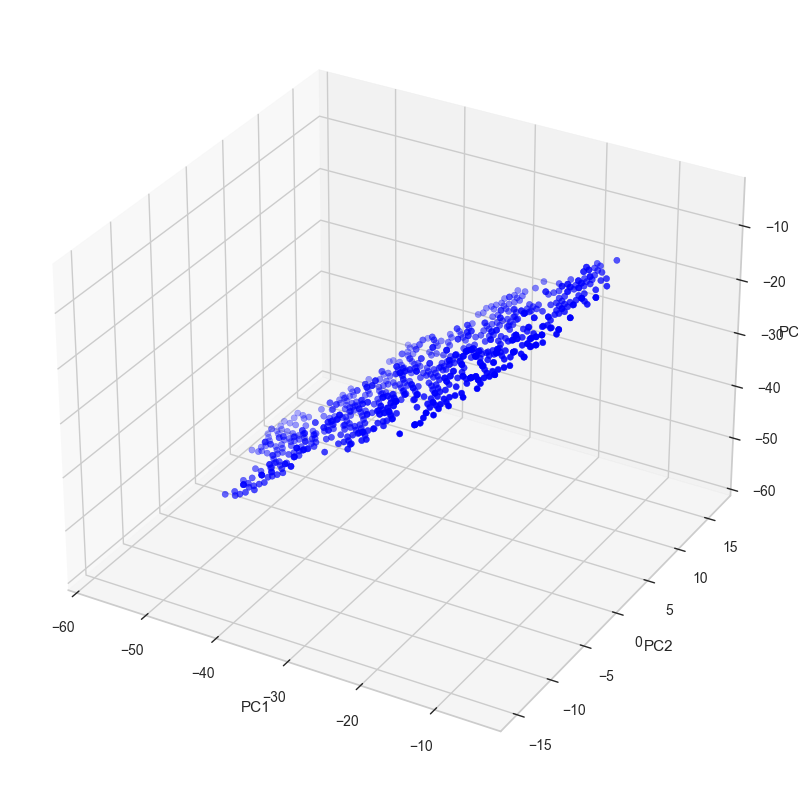

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
plt.figure(figsize=(12,10))
ax = plt.axes(projection='3d')
# ax.scatter3D(new_data[new_data['cal_labels']==-1].iloc[:, 0],new_data[new_data['cal_labels']==-1].iloc[:, 1],new_data[new_data['cal_labels']==-1].iloc[:, 0], color="black")
ax.scatter3D(new_data[new_data['cal_labels']==0].iloc[:, 0],new_data[new_data['cal_labels']==0].iloc[:, 1],new_data[new_data['cal_labels']==0].iloc[:, 0], color="blue")
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3') 
plt.show()


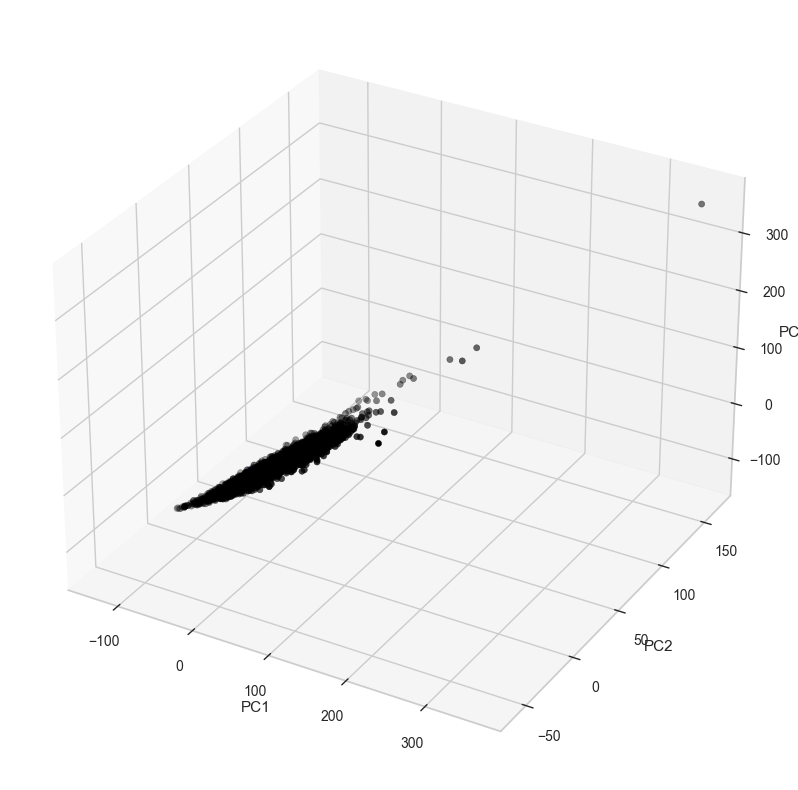

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits import mplot3d
plt.figure(figsize=(12,10))
ax = plt.axes(projection='3d')
ax.scatter3D(new_data[new_data['cal_labels']==-1].iloc[:, 0],new_data[new_data['cal_labels']==-1].iloc[:, 1],new_data[new_data['cal_labels']==-1].iloc[:, 0], color="black")
ax.scatter3D(new_data[new_data['cal_labels']==0].iloc[:, 0],new_data[new_data['cal_labels']==0].iloc[:, 1],new_data[new_data['cal_labels']==0].iloc[:, 0], color="blue")
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3') 
plt.show()
